In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from ema_workbench import (
    load_results,
)
from ema_workbench.analysis import (
    lines
)

In [3]:
from plotting import plot_lines

In [4]:
experiments, outcomes = load_results('../results/0409_100_runs.tar.gz')

In [5]:
experiments.head(3)

,debt_sales_ratio,flood_narrative,init_markup,wage_sensitivity_prod,scenario,policy,model
0,2.052534,"{60: 1000, 120: 1000}",0.459793,0.947164,0,NaN,CRAB
1,3.519865,"{30: 10, 35: 10, 40: 10, 45: 10, 50: 10, 55: 1...",0.079067,0.348303,1,NaN,CRAB
2,1.706686,{75: 1000},0.389368,0.405745,2,NaN,CRAB


In [6]:
# Make DF-readable version of Outcomes
clean_outcomes = {}
for var in outcomes:
    clean_outcomes[var] = outcomes[var][0][0]
clean_outcomes = pd.DataFrame(clean_outcomes)
clean_outcomes

,Household Population,Unemployment Rate,Median Net Worth,Median House Value,Median Wage,Minimum Wage,Total Household Damages,Average Income-Weighted Damages,Firm Population,GDP,...,Wholesale_Retail Population,Wholesale_Retail Production Made,10th Percentile Firm Size (Wholesale_Retail),90th Percentile Firm Size (Wholesale_Retail),Median Firm Size (Wholesale_Retail),C26 Population,C26 Production Made,10th Percentile Firm Size (C26),90th Percentile Firm Size (C26),Median Firm Size (C26)
0,10000,0.8700,1.3340,243.515649,0.600,0.600,0.000000,0.000000,1300,1414.53,...,100,157.17,1.0,1.0,1.0,150,157.17,1.0,1.0,1.0
1,10000,0.6369,1.3340,243.435289,0.600,0.600,0.000000,0.000000,1300,5661.54,...,100,629.06,3.0,3.0,3.0,150,629.06,4.0,4.0,4.0
2,10000,0.4414,1.3340,255.760037,1.024,0.630,0.000000,0.000000,1300,4330.08,...,100,481.12,4.0,6.0,5.0,150,481.12,3.0,3.0,3.0
3,10000,0.2449,1.3340,256.461363,1.043,0.630,0.000000,0.000000,1300,4594.86,...,100,510.54,6.0,9.0,8.0,150,510.54,3.0,4.0,3.0
4,10000,0.2717,1.3265,256.735564,1.039,0.630,0.000000,0.000000,1300,3599.28,...,100,399.92,1.0,12.0,5.5,150,399.92,1.0,4.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,10000,0.6344,0.7740,283.592615,0.696,0.696,9271.398320,1.200564,1300,3580.29,...,100,397.81,1.0,11.0,2.5,150,397.81,1.0,4.0,1.0
146,10000,0.6414,0.7740,286.761944,0.708,0.708,9214.833203,1.170886,1300,3849.66,...,100,427.74,1.0,10.0,2.0,150,427.74,1.0,5.0,1.0
147,10000,0.6547,0.7740,298.119433,0.732,0.732,9195.766808,1.131250,1300,3755.52,...,100,417.28,1.0,8.0,2.0,150,417.28,1.0,4.0,1.0
148,10000,0.6646,0.7740,301.347724,0.744,0.744,9151.321067,1.116356,1300,3719.79,...,100,413.31,1.0,7.1,2.0,150,413.31,1.0,4.0,1.0


In [7]:
# ReplicatorModel-->Model
new_outcomes = {}
for var in outcomes:
    new_outcomes[var] = []
    for a in outcomes[var]:
        new_outcomes[var].append(list(a[0]))
    outcomes[var] = np.array(new_outcomes[var])

In [18]:
outcomes['GDP']

array([[1414.53, 5661.54, 4330.08, ..., 3755.52, 3719.79, 3625.47],
       [1414.53, 5661.54, 5746.5 , ..., 5638.41, 6029.37, 5924.52],
       [1414.53, 5661.54, 4330.08, ..., 5508.  , 5128.65, 5192.55],
       ...,
       [1414.53, 5661.54, 5736.96, ..., 4579.65, 4216.59, 4156.74],
       [1414.53, 5661.54, 5745.42, ..., 4495.23, 4491.72, 4563.81],
       [1414.53, 5661.54, 4331.07, ..., 3699.36, 3456.9 , 3543.03]])

In [20]:
pd.DataFrame(outcomes['GDP']).T

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,1414.53,1414.53,1414.53,1414.53,1414.53,1414.53,1414.53,1414.53,1414.53,1414.53,...,1414.53,1414.53,1414.53,1414.53,1414.53,1414.53,1414.53,1414.53,1414.53,1414.53
1,5661.54,5661.54,5661.54,5661.54,5661.54,5661.54,5661.54,5661.54,5661.54,5661.54,...,5661.54,5661.54,5661.54,5661.54,5661.54,5661.54,5661.54,5661.54,5661.54,5661.54
2,4330.08,5746.50,4330.08,4330.35,4321.80,5745.51,5745.69,4320.72,5736.87,4330.17,...,4321.35,5746.41,4330.35,4321.08,4330.26,5746.95,4329.90,5736.96,5745.42,4331.07
3,4594.86,4594.05,4604.76,4566.96,4619.97,4596.03,4593.51,4633.20,4641.39,4557.33,...,4639.14,4624.47,4662.90,4630.68,4643.01,4564.53,4636.17,4584.42,4663.26,4620.42
4,3599.28,3571.11,3511.17,3605.58,3569.85,3427.83,3654.45,3782.16,3482.10,3725.73,...,3490.74,3509.64,3391.38,3485.34,3565.53,3567.69,3414.33,3714.75,3364.38,3594.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,3580.29,5869.98,5566.32,4087.26,4159.17,4750.74,4833.54,4279.32,8050.23,5840.19,...,4034.16,3636.54,3081.78,3674.97,3624.93,4507.83,3349.80,5271.66,4908.60,3595.77
146,3849.66,6486.84,5995.71,3739.05,3909.69,5055.93,3707.28,4301.82,8970.03,5259.33,...,3978.54,3847.05,3391.47,3636.45,3806.46,4481.28,3546.36,4991.85,4741.83,3626.91
147,3755.52,5638.41,5508.00,4146.57,3908.52,4082.22,4519.26,4267.08,8571.15,5408.28,...,4116.42,3872.61,3277.26,3501.72,3294.36,4171.41,3667.05,4579.65,4495.23,3699.36
148,3719.79,6029.37,5128.65,4130.91,3811.32,4687.56,4420.26,4439.79,7019.64,4312.35,...,4223.43,4082.85,3247.74,3286.98,3275.91,4367.61,3254.58,4216.59,4491.72,3456.90


In [56]:
experiments.head(1)

,debt_sales_ratio,flood_narrative,init_markup,wage_sensitivity_prod,scenario,policy,model
0,2.052534,"{60: 1000, 120: 1000}",0.459793,0.947164,0,NaN,CRAB


In [55]:
experiments.loc[0, 'flood_narrative']

'{60: 1000, 120: 1000}'

In [44]:
N_RUNS = len(outcomes['GDP'])
N_STEPS = len(outcomes['GDP'][0])
N_OUTCOMES = len(outcomes)
print(f'have {N_OUTCOMES} outcomes for {N_RUNS} runs each of length {N_STEPS}')

have 58 outcomes for 100 runs each of length 150


In [62]:

N_RUNS = len(outcomes['GDP'])
N_STEPS = len(outcomes['GDP'][0])
N_OUTCOMES = len(outcomes)

# Combine data into one DF
all_data = {}

#  --> Experiment columns
all_data['Run'] = []
for input in experiments:
    all_data[input] = []
all_data['Step'] = []
for i in range(N_RUNS):
    for j in range(N_STEPS):
        all_data['Run'].append(i)
        for input in experiments:
            all_data[input].append(experiments.loc[i, input])
        all_data['Step'].append(j)
#  --> Data columns
for outcome, data in outcomes.items():
    if outcome == 'TIME':
        continue
    all_data[outcome] = []
    # print(data)
    for run in data:
        all_data[outcome] += [val for val in run]
#  --> Make DF
all_data = pd.DataFrame(all_data)

Run 15000
Step 15000
debt_sales_ratio 15000
flood_narrative 15000
init_markup 15000
wage_sensitivity_prod 15000
scenario 15000
policy 15000
model 15000
Household Population 15000
Unemployment Rate 15000
Median Net Worth 15000
Median House Value 15000
Median Wage 15000
Minimum Wage 15000
Total Household Damages 15000
Average Income-Weighted Damages 15000
Firm Population 15000
GDP 15000
Total Firm Resources 15000
Total Firm Debt 15000
Agriculture Population 15000
Agriculture Production Made 15000
10th Percentile Firm Size (Agriculture) 15000
90th Percentile Firm Size (Agriculture) 15000
Median Firm Size (Agriculture) 15000
Industry Population 15000
Industry Production Made 15000
10th Percentile Firm Size (Industry) 15000
90th Percentile Firm Size (Industry) 15000
Median Firm Size (Industry) 15000
Construction Population 15000
Construction Production Made 15000
10th Percentile Firm Size (Construction) 15000
90th Percentile Firm Size (Construction) 15000
Median Firm Size (Construction) 150

In [64]:
outcomes_df.head()

,Run,Step,debt_sales_ratio,flood_narrative,init_markup,wage_sensitivity_prod,scenario,policy,model,Household Population,...,Wholesale_Retail Population,Wholesale_Retail Production Made,10th Percentile Firm Size (Wholesale_Retail),90th Percentile Firm Size (Wholesale_Retail),Median Firm Size (Wholesale_Retail),C26 Population,C26 Production Made,10th Percentile Firm Size (C26),90th Percentile Firm Size (C26),Median Firm Size (C26)
0,0,0,2.052534,"{60: 1000, 120: 1000}",0.459793,0.947164,0,NaN,CRAB,10000,...,100,157.17,1.0,1.0,1.0,150,157.17,1.0,1.0,1.0
1,0,1,2.052534,"{60: 1000, 120: 1000}",0.459793,0.947164,0,NaN,CRAB,10000,...,100,629.06,3.0,3.0,3.0,150,629.06,4.0,4.0,4.0
2,0,2,2.052534,"{60: 1000, 120: 1000}",0.459793,0.947164,0,NaN,CRAB,10000,...,100,481.12,4.0,6.0,5.0,150,481.12,3.0,3.0,3.0
3,0,3,2.052534,"{60: 1000, 120: 1000}",0.459793,0.947164,0,NaN,CRAB,10000,...,100,510.54,6.0,9.0,8.0,150,510.54,3.0,4.0,3.0
4,0,4,2.052534,"{60: 1000, 120: 1000}",0.459793,0.947164,0,NaN,CRAB,10000,...,100,399.92,1.0,12.0,5.5,150,399.92,1.0,4.0,3.0


In [8]:
FIRM_TYPES = [
    'C26',
    'Agriculture',
    'Industry',
    'Construction',
    'Transport',
    'Utilities',
    'Private_services',
    'Public_services',
    'Wholesale_Retail',
]

In [9]:
outcomes_to_skip = ['TIME', 'Household Population', 'Firm Population']
firm_size_outcomes = []
for f in FIRM_TYPES:
    outcomes_to_skip.append(f'{f} Population')
    firm_size_outcomes.append(f'10th Percentile Firm Size ({f})')
    firm_size_outcomes.append(f'90th Percentile Firm Size ({f})')
    firm_size_outcomes.append(f'Median Firm Size ({f})')


In [10]:
outcomes_to_show = []
for outcome in outcomes:
    if outcome not in outcomes_to_skip and outcome not in firm_size_outcomes:
        outcomes_to_show.append(outcome)

In [11]:
N_STEPS = len(outcomes['Household Population'][0])
N_STEPS

150

In [12]:
# fig, axes = plot_lines(experiments, outcomes, N_STEPS, outcomes_to_show=outcomes_to_show, handle_floods="group_by")

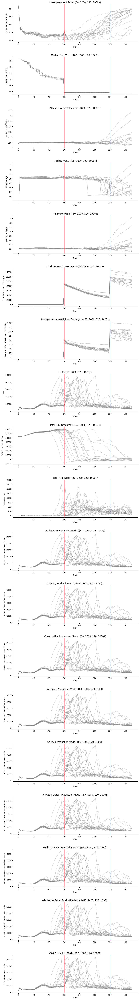

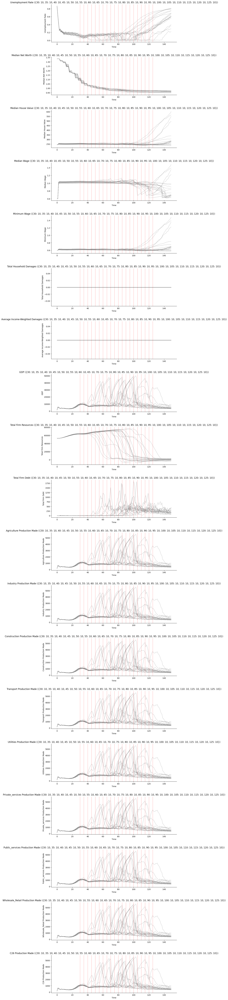

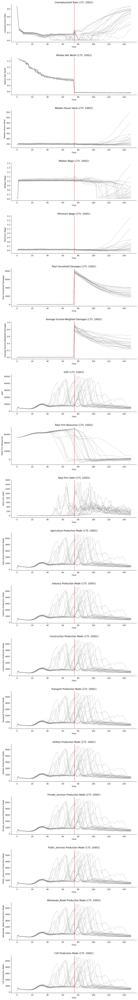

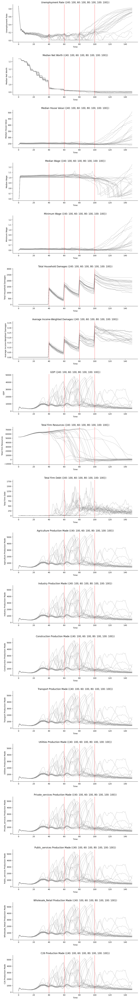

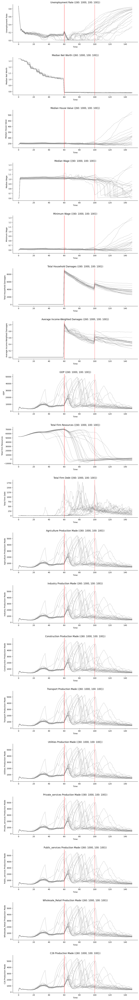

In [13]:
fig, axes = plot_lines(experiments, outcomes, N_STEPS, outcomes_to_show=outcomes_to_show, handle_floods="separate")

## Exploring the experiment space for a bit

In [14]:
experiments.head()

,debt_sales_ratio,flood_narrative,init_markup,wage_sensitivity_prod,scenario,policy,model
0,2.052534,"{60: 1000, 120: 1000}",0.459793,0.947164,0,NaN,CRAB
1,3.519865,"{30: 10, 35: 10, 40: 10, 45: 10, 50: 10, 55: 1...",0.079067,0.348303,1,NaN,CRAB
2,1.706686,{75: 1000},0.389368,0.405745,2,NaN,CRAB
3,1.906881,"{40: 100, 60: 100, 80: 100, 100: 100}",0.472813,0.437414,3,NaN,CRAB
4,4.803182,"{40: 100, 60: 100, 80: 100, 100: 100}",0.433568,0.511907,4,NaN,CRAB


In [15]:
experiments.describe()

,debt_sales_ratio,init_markup,wage_sensitivity_prod
count,100.000000,100.000000,100.000000
mean,2.898989,0.275005,0.500256
std,1.218791,0.130320,0.290328
min,0.816351,0.054184,0.004143
25%,1.859057,0.162562,0.256663
50%,2.901397,0.274816,0.502897
75%,3.942659,0.385812,0.749484
max,4.971855,0.498956,0.994290


In [16]:
# outcome_of_interest = 'Median Net Worth'
# for i, f in fig.items():
#     f, axes[i]

In [17]:
fig[0]

{'Unemployment Rate': <Axes: title={'center': 'Unemployment Rate ({60: 1000, 120: 1000})'}, xlabel='Time', ylabel='Unemployment Rate'>,
 'Median Net Worth': <Axes: title={'center': 'Median Net Worth ({60: 1000, 120: 1000})'}, xlabel='Time', ylabel='Median Net Worth'>,
 'Median House Value': <Axes: title={'center': 'Median House Value ({60: 1000, 120: 1000})'}, xlabel='Time', ylabel='Median House Value'>,
 'Median Wage': <Axes: title={'center': 'Median Wage ({60: 1000, 120: 1000})'}, xlabel='Time', ylabel='Median Wage'>,
 'Minimum Wage': <Axes: title={'center': 'Minimum Wage ({60: 1000, 120: 1000})'}, xlabel='Time', ylabel='Minimum Wage'>,
 'Total Household Damages': <Axes: title={'center': 'Total Household Damages ({60: 1000, 120: 1000})'}, xlabel='Time', ylabel='Total Household Damages'>,
 'Average Income-Weighted Damages': <Axes: title={'center': 'Average Income-Weighted Damages ({60: 1000, 120: 1000})'}, xlabel='Time', ylabel='Average Income-Weighted Damages'>,
 'GDP': <Axes: title=